# Pix2Pix
[TensorFlow 2.0 Tutorial](https://www.tensorflow.org/tutorials/generative/pix2pix)

In [1]:
import tensorflow as tf

import os
import time
import imageio
import pathlib

from matplotlib import pyplot as plt
from IPython import display

In [2]:
pip install -q -U tensorboard

## Load the dataset

Download the dataset from [here](https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/facades.tar.gz) and preprocess it

In [3]:
url = "https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/facades.tar.gz"
path_to_zip = tf.keras.utils.get_file(
    "facades.tar.gz", 
    origin=url, 
    extract=True
)
datapath = pathlib.Path(path_to_zip).parent / "facades/"
train_datapath = datapath / "train"
val_datapath = datapath / "val"
test_datapath = datapath / "test"

30171136/30168306 [==============================] - 3s 0us/step


In [4]:
BUFFER_SIZE = 400
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

Let's visualize one of the images to see how they are represented

Image dimensions: (256, 512, 3)


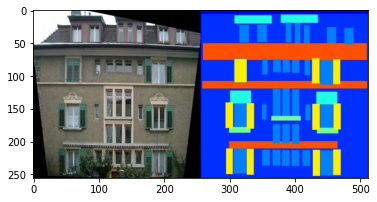

In [5]:
all_images = list(train_datapath.iterdir())
example_image = imageio.imread(all_images[0])
print(f"Image dimensions: {example_image.shape}")
plt.imshow(example_image)

As we can see, images are concatenated along the x dimension. We will take this into account in our `load` function

In [6]:
def load(image_file):
  image = tf.io.read_file(image_file)
  image = tf.image.decode_jpeg(image)

  w = tf.shape(image)[1]

  w = w // 2
  real_image = image[:, :w, :]
  input_image = image[:, w:, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

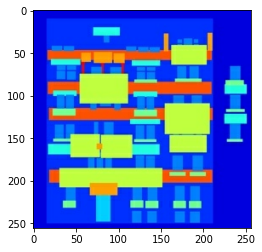

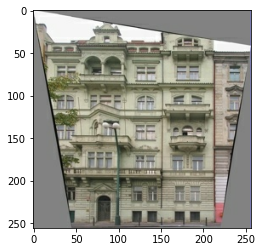

In [7]:
inp, re = load(str(train_datapath / '100.jpg'))
# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(inp/255.0)
plt.figure()
plt.imshow(re/255.0)

In [8]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(
      input_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
  )
  real_image = tf.image.resize(
      real_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
  )

  return input_image, real_image

In [9]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)  # stacked_image dimensions are [2, H, W, C]
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3]
  )

  return cropped_image[0], cropped_image[1]

In [10]:
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [11]:
@tf.function()
def random_jitter(input_image, real_image):
  # resizing to 286 x 286 x 3
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # randomly cropping to 256 x 256 x 3
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

As you can see in the images below that they are going through random jittering as described in the paper is to

- Resize an image to bigger height and width
- Randomly crop to the target size
- Randomly flip the image horizontally

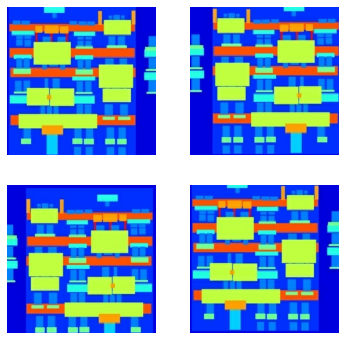

In [12]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i+1)
  plt.imshow(rj_inp/255.0)
  plt.axis('off')
plt.show()

In [13]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [14]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  # In test we just resize to the desired dimensions, instead of random jittering
  input_image, real_image = resize(input_image, real_image, IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

## Input pipeline

In [15]:
train_dataset = tf.data.Dataset.list_files(str(train_datapath / "*.jpg"))
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [16]:
test_dataset = tf.data.Dataset.list_files(str(test_datapath / "*.jpg"))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

## Build the generator

The architecture of generator is a modified U-Net.
- Each block in the encoder is (Conv -> Batchnorm -> Leaky ReLU)
- Each block in the decoder is (Transposed Conv -> Batchnorm -> Dropout(applied to the first 3 blocks) -> ReLU)
- There are skip connections between the encoder and decoder (as in U-Net).

In [17]:
OUTPUT_CHANNELS = 3

In [18]:
def downsample(filters, size, apply_batchnorm=True, name="downsample_block"):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(
          filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False
      )
  )
  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())
  
  result.add(tf.keras.layers.LeakyReLU())
  return result

In [19]:
def upsample(filters, size, apply_dropout=False, name="upsample_block"):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(
        filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False
    )
  )

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [20]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,3])

  # Layer definition
  down_stack = [
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
    downsample(512, 4), # (bs, 4, 4, 512)
    downsample(512, 4), # (bs, 2, 2, 512)
    downsample(512, 4), # (bs, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
    upsample(512, 4), # (bs, 16, 16, 1024)
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(
      OUTPUT_CHANNELS, 4, strides=2, padding='same', kernel_initializer=initializer, activation='tanh'
  ) # (bs, 256, 256, 3)

  # Model pass-through
  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

Let's visualize the Generator model

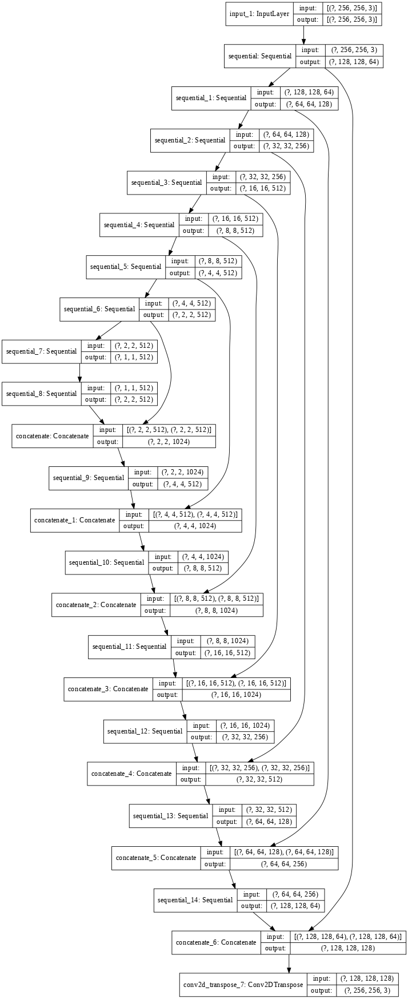

In [21]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


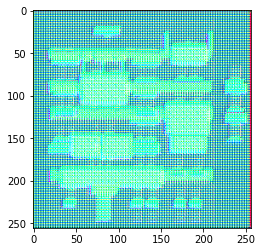

In [22]:
gen_output = generator(inp[tf.newaxis,...], training=False)
plt.imshow(gen_output[0,...])

Generator loss
- It is a sigmoid cross entropy loss of the generated images and an array of ones.
- The paper also includes L1 loss which is MAE (mean absolute error) between the generated image and the target image.
- This allows the generated image to become structurally similar to the target image.
- The formula to calculate the total generator loss = gan_loss + LAMBDA * l1_loss, where LAMBDA = 100. 

This value was decided by the authors of the paper.

In [23]:
LAMBDA = 100

In [24]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

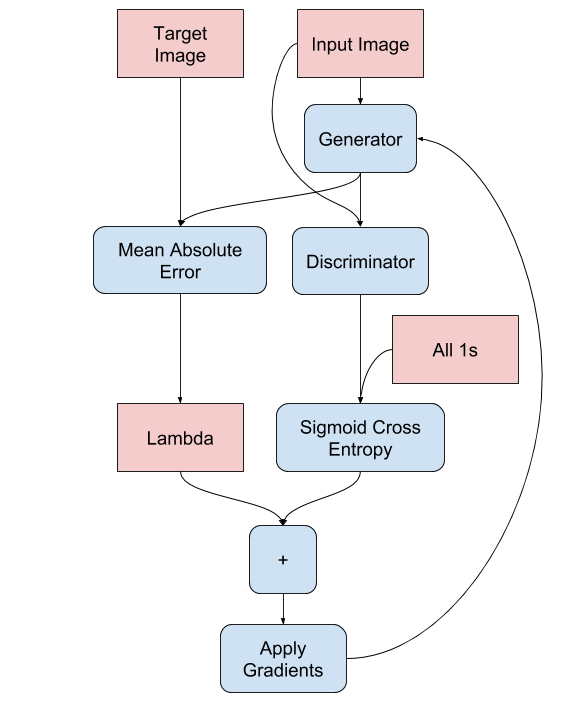

Build the Discriminator
- The Discriminator is a PatchGAN.
- Each block in the discriminator is (Conv -> BatchNorm -> Leaky ReLU)
- The shape of the output after the last layer is (batch_size, 30, 30, 1)
- Each 30x30 patch of the output classifies a 70x70 portion of the input image (such an architecture is called a PatchGAN).
- Discriminator receives 2 inputs.
  - Input image and the target image, which it should classify as real.
  - Input image and the generated image (output of generator), which it should classify as fake.
  - We concatenate these 2 inputs together in the code (tf.concat([inp, tar], axis=-1))

In [25]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(
      512, 4, strides=1, kernel_initializer=initializer, use_bias=False
  )(zero_pad1) # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(
      1, 4, strides=1, kernel_initializer=initializer
  )(zero_pad2) # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

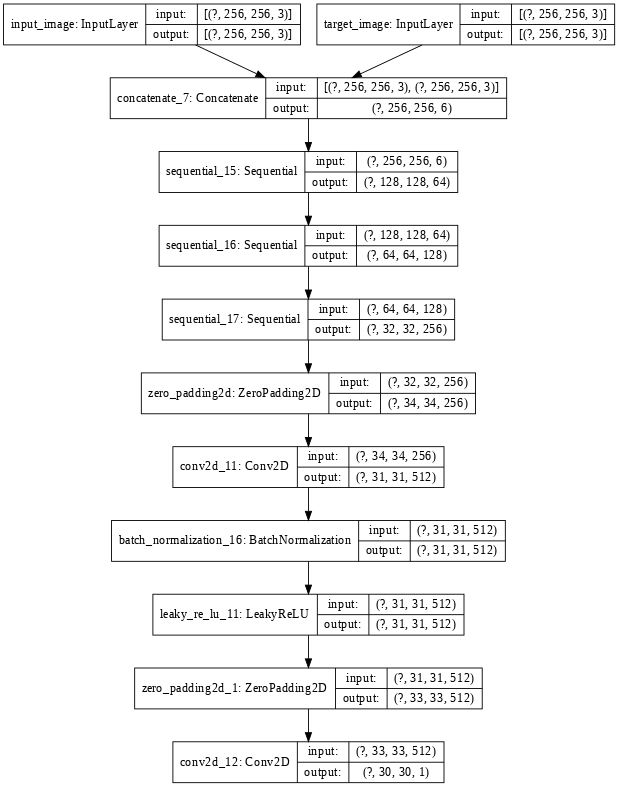

In [26]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

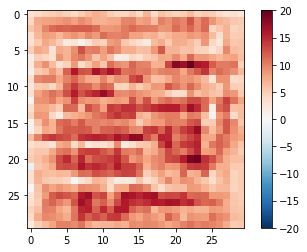

In [27]:
disc_out = discriminator([inp[tf.newaxis,...], gen_output], training=False)
plt.imshow(disc_out[0,...,-1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

Discriminator loss

- The discriminator loss function takes 2 inputs; real images, generated images
- real_loss is a sigmoid cross entropy loss of the real images and an array of ones(since these are the real images)
- generated_loss is a sigmoid cross entropy loss of the generated images and an array of zeros(since these are the fake images)
- Then the total_loss is the sum of real_loss and the generated_loss

In [28]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [29]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

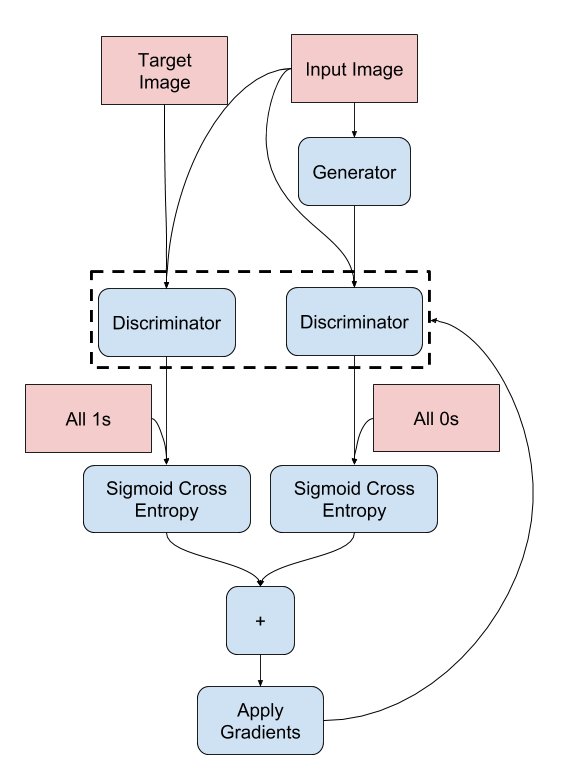

## Define the Optimizers and Checkpoint-saver

In [30]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [31]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(
    generator_optimizer=generator_optimizer,
    discriminator_optimizer=discriminator_optimizer,
    generator=generator,
    discriminator=discriminator
)

## Generate images

In [32]:
def generate_images(model, test_input, tar):
  """ Function to generate images from a trained model and a test_input """
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

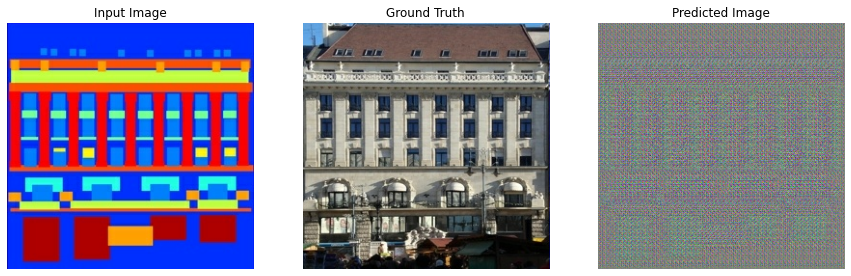

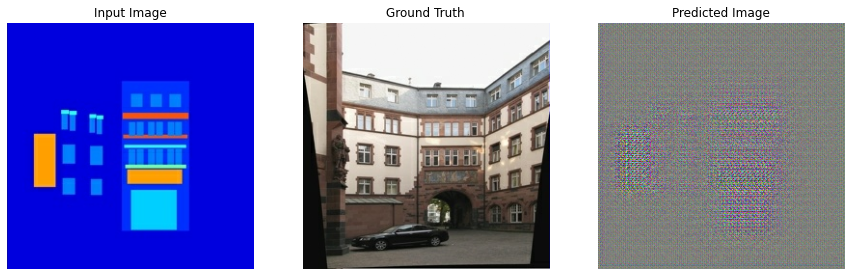

In [33]:
for example_input, example_target in test_dataset.take(2):
  generate_images(generator, example_input, example_target)

## Training

In [34]:
EPOCHS = 150

In [35]:
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [36]:
@tf.function
def train_step(input_image, target, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
    tf.summary.scalar('disc_loss', disc_loss, step=epoch)

The **training loop** does the following:
- Iterates over the number of epochs.
- On each epoch it clears the display, and runs generate_images to show it's progress.
- On each epoch it iterates over the training dataset, printing a '.' for each example.
- It saves a checkpoint every 20 epochs.

In [37]:
def fit(train_ds, epochs, test_ds):
  for epoch in range(epochs):
    start = time.time()

    display.clear_output(wait=True)

    for example_input, example_target in test_ds.take(1):
      generate_images(generator, example_input, example_target)
    print("Epoch: ", epoch)

    # Train
    for n, (input_image, target) in train_ds.enumerate():
      print('.', end='')
      if (n+1) % 100 == 0:
        print()
      train_step(input_image, target, epoch)
    print()

    # saving (checkpoint) the model every 20 epochs
    if (epoch + 1) % 20 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print('Time taken for epoch {} is {} sec\n'.format(epoch + 1, time.time()-start))
  checkpoint.save(file_prefix=checkpoint_prefix)

In [38]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

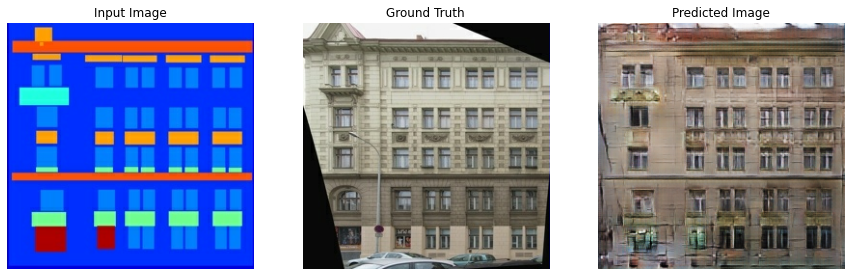

Epoch:  149
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

Time taken for epoch 150 is 39.392157316207886 sec



In [39]:
fit(train_dataset, EPOCHS, test_dataset)

Interpreting the logs from a GAN is more subtle than a simple classification or regression model. Things to look for::

* Check that neither model has "won". If either the gen_gan_loss or the disc_loss gets very low it's an indicator that this model is dominating the other, and you are not successfully training the combined model.

* The value $log(2) = 0.69$ is a good reference point for these losses, as it indicates a perplexity of 2: That the discriminator is on average equally uncertain about the two options.

* For the disc_loss a value below 0.69 means the discriminator is doing better than random, on the combined set of real+generated images.
For the gen_gan_loss a value below 0.69 means the generator i doing better than random at foolding the descriminator.

* As training progresses the gen_l1_loss should go down.

## Generate using test dataset

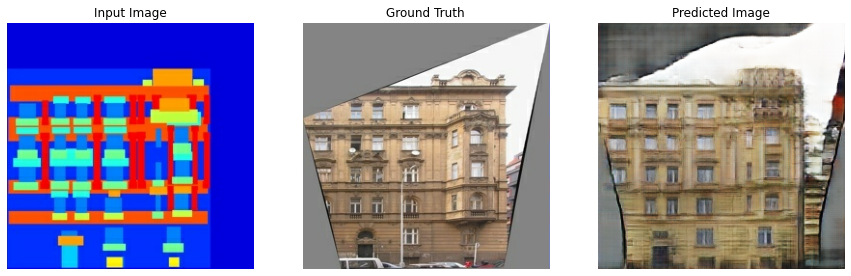

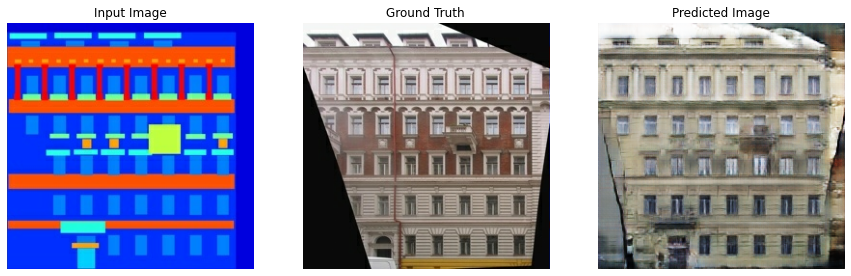

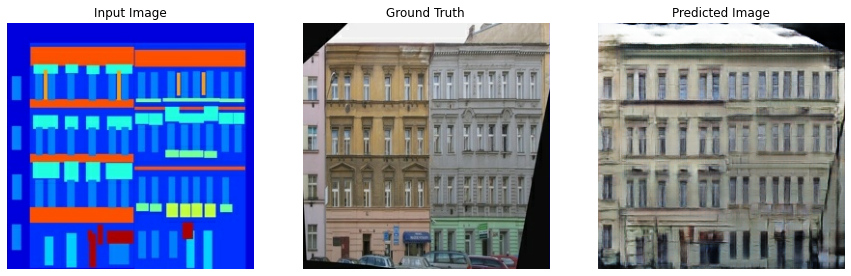

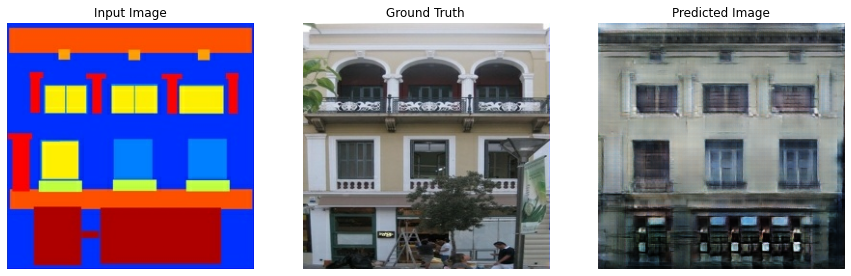

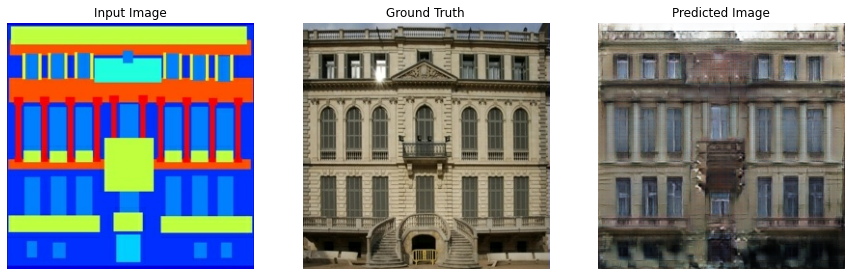

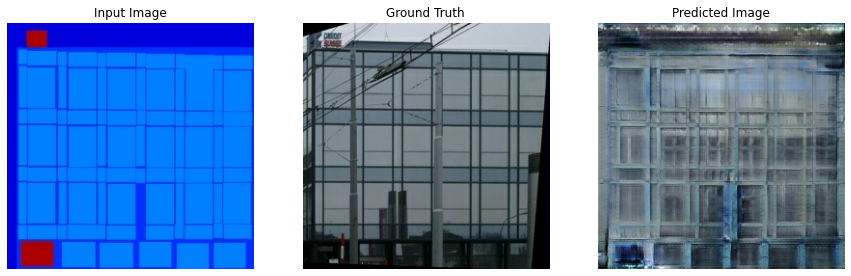

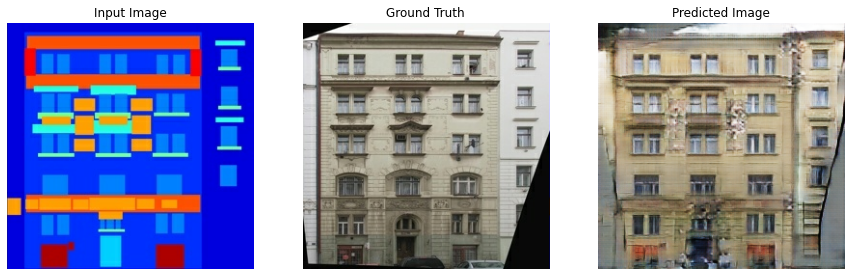

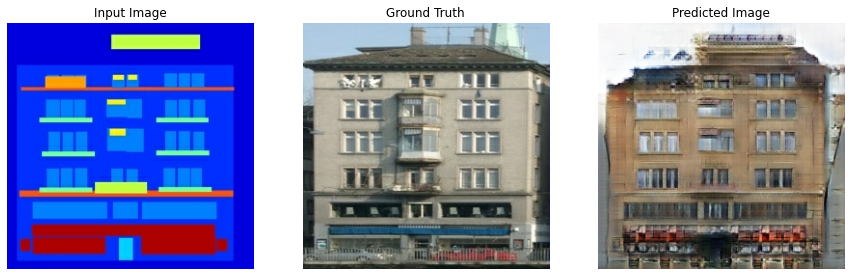

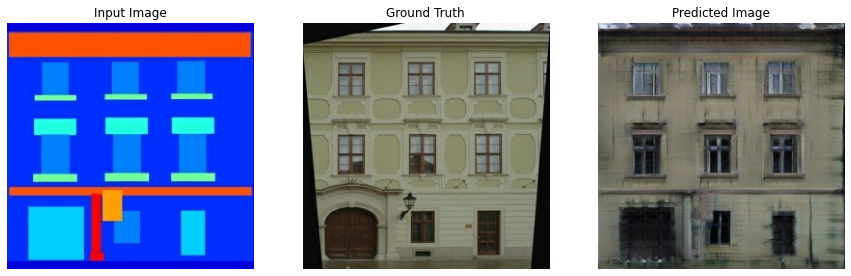

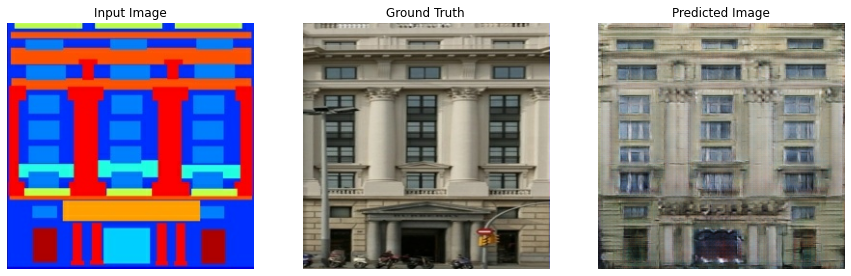

In [42]:
n_samples = 10

# Run the trained model on a few examples from the test dataset
for inp, tar in test_dataset.take(n_samples):
  generate_images(generator, inp, tar)